# Cuisine Clustering

Resources:
- https://www.kaggle.com/mrfroll/whats-cooking/10-most-used-ingredients-by-cuisines/code



In [105]:
import pandas as pd
import numpy as np
import json
import itertools
import collections
import pprint
from gensim import corpora, models, similarities, matutils
from sklearn.preprocessing import Normalizer
from sklearn.pipeline import make_pipeline
from sklearn.decomposition import PCA

import matplotlib.pyplot as plt
import matplotlib.cm as cm
from sklearn.metrics import silhouette_samples, silhouette_score

**Import a csv file with a list of recipes, identified by their type of cuisine and contains a list of ingredients**


In [2]:
with open('train.json') as data_file:
    data = json.load(data_file)

**Merge data into dictionary of all ingredients per used for recipes in each cuisine**

In [150]:
def cuisine_list(data):
    '''function takes in list of json and returns dictionary of all unique cuisines 
    and each ingredient from the cuisines' recipes'''

    cuisine_dictionary = {}
    
    
    for d in data:
        cuisine = d["cuisine"]
        ingredients = d["ingredients"]
        cuisine_dictionary.setdefault(cuisine, []).append(ingredients)
    num_cuisines = len(cuisine_dictionary)
    return cuisine_dictionary, num_cuisines

In [151]:
#create list of unique cuisines
cuisine_dict = cuisine_list(data)
#pprint.pprint(cuisine_dict, width=1)

20


{'brazilian': [['ice cubes', 'club soda', 'white rum', 'lime', 'turbinado'],
  ['eggs',
   'hearts of palm',
   'cilantro',
   'coconut cream',
   'flax seed meal',
   'kosher salt',
   'jalapeno chilies',
   'garlic',
   'cream cheese, soften',
   'coconut oil',
   'lime juice',
   'crushed red pepper flakes',
   'ground coriander',
   'pepper',
   'chicken breasts',
   'coconut flour',
   'onions'],
  ['sweetened condensed milk', 'butter', 'cocoa powder'],
  ['lime', 'crushed ice', 'simple syrup', 'cachaca'],
  ['sugar',
   'corn starch',
   'egg whites',
   'boiling water',
   'cold water',
   'egg yolks',
   'sweetened condensed milk',
   'milk',
   'Jell-O Gelatin Dessert'],
  ['olive oil',
   'low sodium chicken broth',
   'cilantro leaves',
   'chile powder',
   'fresh thyme',
   'chile pepper',
   'sweet paprika',
   'sablefish',
   'brown rice',
   'yellow onion',
   'low-fat coconut milk',
   'roma tomatoes',
   'garlic',
   'fresh lime juice'],
  ['eggs', 'grating cheese', '

## Topic Modeling with Gensim 

In [4]:
# gensim
from gensim import corpora, models, similarities, matutils
# sklearn
from sklearn import datasets
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.cluster import KMeans
# logging for gensim (set to INFO)
import logging
logging.basicConfig(format='%(asctime)s : %(levelname)s : %(message)s', level=logging.INFO)

Create list of lists for the ingredients in all recipes in the data

In [77]:
def ingredient_list(data):
    '''function takes in list of json and returns list of 
    lists for all ingredients in each recipe'''
    
    ingredient_list = []
    
    for d in data:
        ingredients = d["ingredients"]
        ingredient_list.append(ingredients)
    return ingredient_list

In [78]:
ingredient_list = (ingredient_list(data))
#pprint.pprint(ingredient_list, width=1)

In [163]:
ingredient_list

[['romaine lettuce',
  'black olives',
  'grape tomatoes',
  'garlic',
  'pepper',
  'purple onion',
  'seasoning',
  'garbanzo beans',
  'feta cheese crumbles'],
 ['plain flour',
  'ground pepper',
  'salt',
  'tomatoes',
  'ground black pepper',
  'thyme',
  'eggs',
  'green tomatoes',
  'yellow corn meal',
  'milk',
  'vegetable oil'],
 ['eggs',
  'pepper',
  'salt',
  'mayonaise',
  'cooking oil',
  'green chilies',
  'grilled chicken breasts',
  'garlic powder',
  'yellow onion',
  'soy sauce',
  'butter',
  'chicken livers'],
 ['water', 'vegetable oil', 'wheat', 'salt'],
 ['black pepper',
  'shallots',
  'cornflour',
  'cayenne pepper',
  'onions',
  'garlic paste',
  'milk',
  'butter',
  'salt',
  'lemon juice',
  'water',
  'chili powder',
  'passata',
  'oil',
  'ground cumin',
  'boneless chicken skinless thigh',
  'garam masala',
  'double cream',
  'natural yogurt',
  'bay leaf'],
 ['plain flour',
  'sugar',
  'butter',
  'eggs',
  'fresh ginger root',
  'salt',
  'ground 

Create one master list of recipes as strings

In [79]:
' '.join(ingredient_list[0])

'romaine lettuce black olives grape tomatoes garlic pepper purple onion seasoning garbanzo beans feta cheese crumbles'

In [8]:
text = [' '.join(ingredients) for ingredients in ingredient_list]

Fit the recipes to the vectorizer

In [82]:
# Create a CountVectorizer for parsing/counting words
count_vectorizer = CountVectorizer(ngram_range=(1,2))
count_vectorizer.fit(text)

CountVectorizer(analyzer='word', binary=False, decode_error='strict',
        dtype=<class 'numpy.int64'>, encoding='utf-8', input='content',
        lowercase=True, max_df=1.0, max_features=None, min_df=1,
        ngram_range=(1, 2), preprocessor=None, stop_words=None,
        strip_accents=None, token_pattern='(?u)\\b\\w\\w+\\b',
        tokenizer=None, vocabulary=None)

In [83]:
# Create the term-document matrix
# Transpose it so the terms are the rows
counts = count_vectorizer.transform(text).transpose()

In [84]:
# Convert sparse matrix of counts to a gensim corpus
corpus = matutils.Sparse2Corpus(counts)

In [85]:
id2word = dict((v, k) for k, v in count_vectorizer.vocabulary_.items())

TypeError: 'dict' object is not callable

In [86]:
len(id2word)

1678

**Create the LDA model**

There are 20 known cuisines, or topics

In [15]:
lda = models.LdaModel(corpus=corpus, num_topics=20, id2word=id2word, passes=10)

2017-03-02 21:54:40,870 : INFO : using symmetric alpha at 0.05
2017-03-02 21:54:40,872 : INFO : using symmetric eta at 0.000595947556615
2017-03-02 21:54:40,874 : INFO : using serial LDA version on this node
2017-03-02 21:54:41,219 : INFO : running online LDA training, 20 topics, 10 passes over the supplied corpus of 100 documents, updating model once every 100 documents, evaluating perplexity every 100 documents, iterating 50x with a convergence threshold of 0.001000
2017-03-02 21:54:42,152 : INFO : -23.650 per-word bound, 13164980.0 perplexity estimate based on a held-out corpus of 100 documents with 3576 words
2017-03-02 21:54:42,153 : INFO : PROGRESS: pass 0, at document #100/100
2017-03-02 21:54:42,567 : INFO : topic #5 (0.050): 0.015*"salt" + 0.011*"cheese" + 0.010*"sauce" + 0.010*"garlic" + 0.009*"grated" + 0.008*"pepper" + 0.007*"sugar" + 0.007*"flour" + 0.006*"chili" + 0.006*"juice"
2017-03-02 21:54:42,568 : INFO : topic #11 (0.050): 0.017*"fresh" + 0.014*"oil" + 0.013*"ground

Generate 20 topics comprised of different coefficients for ingredients

In [16]:
lda.print_topics()

2017-03-02 21:54:53,912 : INFO : topic #0 (0.050): 0.019*"pepper" + 0.016*"salt" + 0.015*"oil" + 0.009*"ground" + 0.009*"tomatoes" + 0.009*"chopped" + 0.009*"black" + 0.009*"black pepper" + 0.009*"leaf" + 0.006*"corn"
2017-03-02 21:54:53,913 : INFO : topic #1 (0.050): 0.019*"pepper" + 0.017*"ground" + 0.014*"sauce" + 0.013*"fresh" + 0.013*"lemon" + 0.013*"lemon juice" + 0.013*"juice" + 0.013*"onions" + 0.009*"oil" + 0.009*"powder"
2017-03-02 21:54:53,915 : INFO : topic #2 (0.050): 0.023*"pepper" + 0.015*"ground" + 0.015*"oil" + 0.015*"salt" + 0.011*"flour" + 0.011*"purpose flour" + 0.011*"all" + 0.011*"purpose" + 0.011*"buttermilk" + 0.011*"all purpose"
2017-03-02 21:54:53,917 : INFO : topic #3 (0.050): 0.019*"sauce" + 0.013*"oil" + 0.013*"pepper" + 0.007*"sugar" + 0.007*"white" + 0.007*"black pepper" + 0.007*"black" + 0.007*"garlic" + 0.007*"cooking" + 0.007*"rice"
2017-03-02 21:54:53,918 : INFO : topic #4 (0.050): 0.010*"tomatoes" + 0.010*"cheese" + 0.010*"pesto" + 0.010*"plum tomato

[(0,
  '0.019*"pepper" + 0.016*"salt" + 0.015*"oil" + 0.009*"ground" + 0.009*"tomatoes" + 0.009*"chopped" + 0.009*"black" + 0.009*"black pepper" + 0.009*"leaf" + 0.006*"corn"'),
 (1,
  '0.019*"pepper" + 0.017*"ground" + 0.014*"sauce" + 0.013*"fresh" + 0.013*"lemon" + 0.013*"lemon juice" + 0.013*"juice" + 0.013*"onions" + 0.009*"oil" + 0.009*"powder"'),
 (2,
  '0.023*"pepper" + 0.015*"ground" + 0.015*"oil" + 0.015*"salt" + 0.011*"flour" + 0.011*"purpose flour" + 0.011*"all" + 0.011*"purpose" + 0.011*"buttermilk" + 0.011*"all purpose"'),
 (3,
  '0.019*"sauce" + 0.013*"oil" + 0.013*"pepper" + 0.007*"sugar" + 0.007*"white" + 0.007*"black pepper" + 0.007*"black" + 0.007*"garlic" + 0.007*"cooking" + 0.007*"rice"'),
 (4,
  '0.010*"tomatoes" + 0.010*"cheese" + 0.010*"pesto" + 0.010*"plum tomatoes" + 0.010*"mozzarella cheese" + 0.010*"mozzarella" + 0.010*"plum" + 0.010*"pesto part" + 0.010*"part" + 0.010*"part skim"'),
 (5,
  '0.019*"cheese" + 0.016*"salt" + 0.012*"grated" + 0.009*"garlic" + 0.

## Clustering text using K-means
### Regroup each recipe into new clusters, without cuisines

In [14]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics import silhouette_score
from sklearn.decomposition import TruncatedSVD

Create a count vectorizer accounting for TFIDF. Common ingredients accross all recipes will have less importance

In [15]:
tfidf_vectorizer = TfidfVectorizer()
X = tfidf_vectorizer.fit_transform(text)

**Run basic k-means model**

In [16]:
km = KMeans(n_clusters=20, init='k-means++', max_iter=100, n_init=1)

In [17]:
km.fit(X)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=100,
    n_clusters=20, n_init=1, n_jobs=1, precompute_distances='auto',
    random_state=None, tol=0.0001, verbose=0)

In [18]:
km.inertia_

64.8990348472067

The Silhouette Coefficient is calculated using the mean intra-cluster
distance (``a``) and the mean nearest-cluster distance (``b``) for each
sample.

The best value is 1 and the worst value is -1. Values near 0 indicate
overlapping clusters. Negative values generally indicate that a sample has
been assigned to the wrong cluster, as a different cluster is more similar.

In [19]:
silhouette_score(X, km.labels_, sample_size=1000)

0.026535491069063243

**Dimensionality Reduction**

Dimensionality reduction using truncated SVD (aka LSA).
This transformer performs linear dimensionality reduction by means of truncated singular value decomposition (SVD). Contrary to PCA, this estimator does not center the data before computing the singular value decomposition. This means it can work with scipy.sparse matrices efficiently.
In particular, truncated SVD works on term count/tf-idf matrices as returned by the vectorizers in sklearn.feature_extraction.text. In that context, it is known as latent semantic analysis (LSA).

In [20]:
LSA = TruncatedSVD(n_components=2)
X = LSA.fit_transform(X)

In [21]:
num_clusters = 20
km = KMeans(n_clusters=num_clusters, init='k-means++', max_iter=100, n_init=1)
km.fit(X)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=100,
    n_clusters=20, n_init=1, n_jobs=1, precompute_distances='auto',
    random_state=None, tol=0.0001, verbose=0)

In [22]:
silhouette_score(X, km.labels_, sample_size=1000)

0.42102887478259388

In [23]:
km.inertia_

0.1542732713148964

**Look at ingredients that make up each cluster**

(This code needs work) 
http://brandonrose.org/clustering

In [44]:
features = tfidf_vectorizer.get_feature_names()

In [55]:
print("Top terms per cluster:")
print
#sort cluster centers by proximity to centroid
order_centroids = km.cluster_centers_.argsort()[:, ::-1] 

for i in range(num_clusters):
    print("Cluster %d words:" % i)
    
    for ind in order_centroids[i, :10]: #replace 10 with n words per cluster
        print(features[ind])
    print()

Top terms per cluster:
Cluster 0 words:
00
14
10
100

Cluster 1 words:
00
10
100
14

Cluster 2 words:
00
100
14
10

Cluster 3 words:
00
10
14
100

Cluster 4 words:
00
10
14
100

Cluster 5 words:
00
100
14
10

Cluster 6 words:
00
14
10
100

Cluster 7 words:
00
14
10
100

Cluster 8 words:


IndexError: index 8 is out of bounds for axis 0 with size 8

## Cluster cuisines with similar cuisines

K-means is re-run. This time each cuisine will be clustered with similar cuisines based off of a master list of ingredients used in each cuisine

In [24]:
def clustering_dict(dict):
    '''takes in dictionary of cuisines and their recipes. Returns one list of recipes per cuisine'''
    for key in dict:
        ingredients = dict[key]
        text = [' '.join(ingredient) for ingredient in ingredients]
        dict[key] = text
    return dict

In [27]:
#dict = (clustering_dict(cuisine_dict))

In [28]:
def join_string(dict):
    '''takes in dictionary of cuisines and recipes, make recipe into one document for vectorizer'''
    for key in dict:
        recipe = dict[key]
        r = [' '.join(recipe)]
        dict[key] = r
    return dict

In [29]:
d = join_string(dict)

Turn dictionary into dataframe

In [30]:
cuisine_df = pd.DataFrame(d)

Vectorize cuisine ingredients and use tfidf to account for common ingredients accross all recipes (ie salt)

In [133]:
tfidf_vectorizer = TfidfVectorizer()
X = tfidf_vectorizer.fit_transform(cuisine_df.iloc[0])

In [134]:
print(X)

  (0, 1328)	0.0676595553036
  (0, 753)	0.0218880013693
  (0, 617)	0.00307923222581
  (0, 2523)	0.00966565075766
  (0, 2943)	0.0944640059096
  (0, 2324)	0.00769808056452
  (0, 1536)	0.198145840532
  (0, 2824)	0.0041862844896
  (0, 898)	0.0817920051168
  (0, 1259)	0.018749151246
  (0, 1857)	0.0149760009369
  (0, 1915)	0.0413235825023
  (0, 596)	0.101376006342
  (0, 626)	0.163584010234
  (0, 708)	0.0403200025224
  (0, 1006)	0.00200671194667
  (0, 2411)	0.00241641268941
  (0, 1666)	0.00697714081601
  (0, 1471)	0.0253440015855
  (0, 2349)	0.279936017512
  (0, 1356)	0.0218880013693
  (0, 550)	0.0276480017296
  (0, 1094)	0.223488013981
  (0, 522)	0.0668160041799
  (0, 2527)	0.00307923222581
  :	:
  (19, 158)	0.00458558500704
  (19, 1295)	0.00152852833568
  (19, 1874)	0.00152852833568
  (19, 662)	0.00305705667136
  (19, 2962)	0.00152852833568
  (19, 1865)	0.00152852833568
  (19, 2963)	0.00152852833568
  (19, 2559)	0.00152852833568
  (19, 1102)	0.00152852833568
  (19, 1455)	0.00152852833568
  (

**Reduce dimensionality with SVD and re-normalize data**

In [152]:
svd = TruncatedSVD(n_components=4, n_iter=10)
normalizer = Normalizer(copy=False)

In [153]:
lsa = make_pipeline(svd, normalizer)

In [154]:
X = lsa.fit_transform(X)

In [155]:
km = KMeans(n_clusters=8, init='k-means++', n_init=10)

In [156]:
km.fit(X)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=8, n_init=10, n_jobs=1, precompute_distances='auto',
    random_state=None, tol=0.0001, verbose=0)

In [157]:
silhouette_score(X, km.labels_)

0.38949688669502469

In [158]:
km.inertia_

0.2125547194585336

In [159]:
km.predict(X)

array([5, 2, 0, 4, 1, 6, 0, 7, 2, 0, 5, 4, 4, 5, 3, 2, 2, 0, 1, 1], dtype=int32)

In [160]:
cuisine_df

,brazilian,british,cajun_creole,chinese,filipino,french,greek,indian,irish,italian,jamaican,japanese,korean,mexican,moroccan,russian,southern_us,spanish,thai,vietnamese
0,ice cubes club soda white rum lime turbinado e...,greek yogurt lemon curd confectioners sugar ra...,herbs lemon juice fresh tomatoes paprika mango...,low sodium soy sauce fresh ginger dry mustard ...,eggs pepper salt mayonaise cooking oil green c...,sugar salt fennel bulb water lemon olive oil g...,romaine lettuce black olives grape tomatoes ga...,water vegetable oil wheat salt black pepper sh...,cooking spray salt black pepper yukon gold pot...,sugar pistachio nuts white almond bark flour v...,plain flour sugar butter eggs fresh ginger roo...,sirloin mirin yellow onion low sodium soy sauc...,jasmine rice garlic scallions sugar shiitake G...,olive oil purple onion fresh pineapple pork po...,ground cloves whole nutmegs ground ginger grou...,water grits mozzarella cheese salt water dill ...,plain flour ground pepper salt tomatoes ground...,olive oil salt medium shrimp pepper garlic cho...,sugar hot chili asian fish sauce lime juice po...,soy sauce vegetable oil red bell pepper chicke...


## Visualizing Silhouette scores with various clusters

In [161]:
range_n_clusters = [2, 3, 4, 5, 6, 8, 9, 10]

For n_clusters = 2 The average silhouette_score is : 0.444010362402


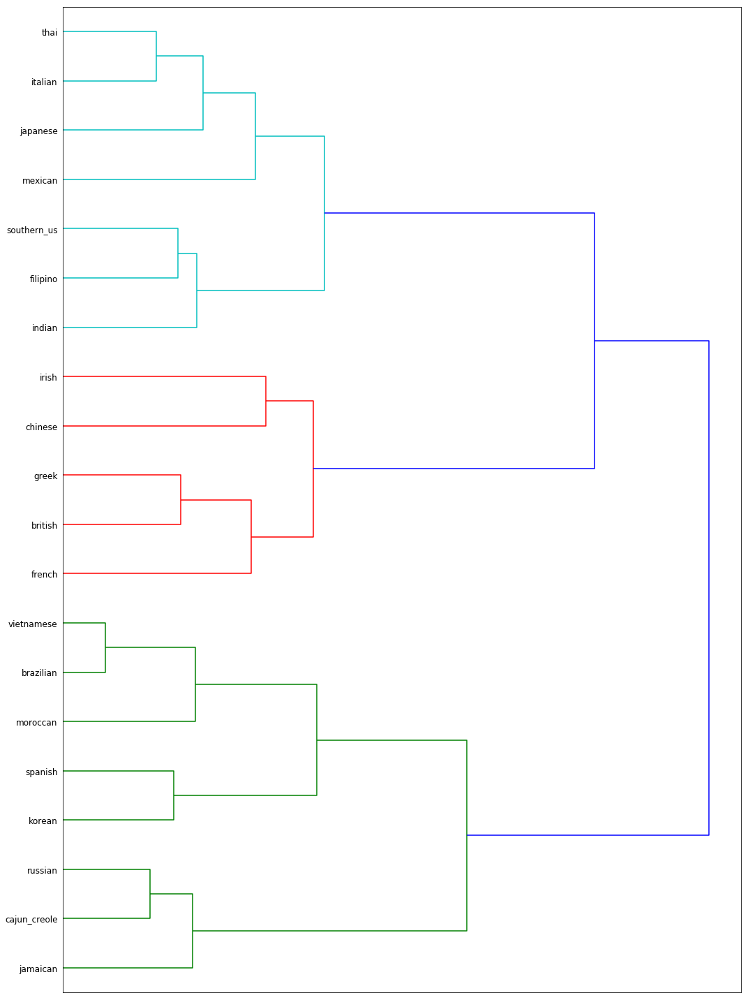

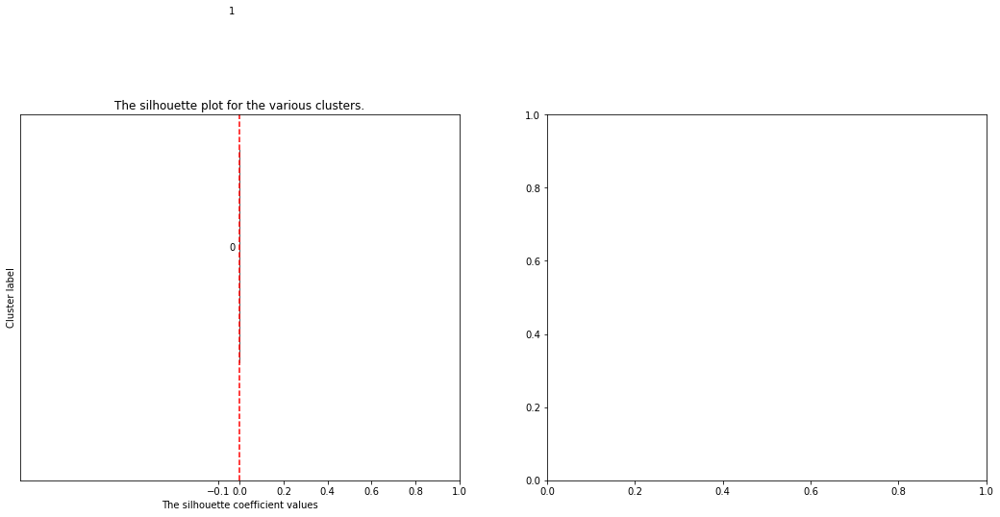

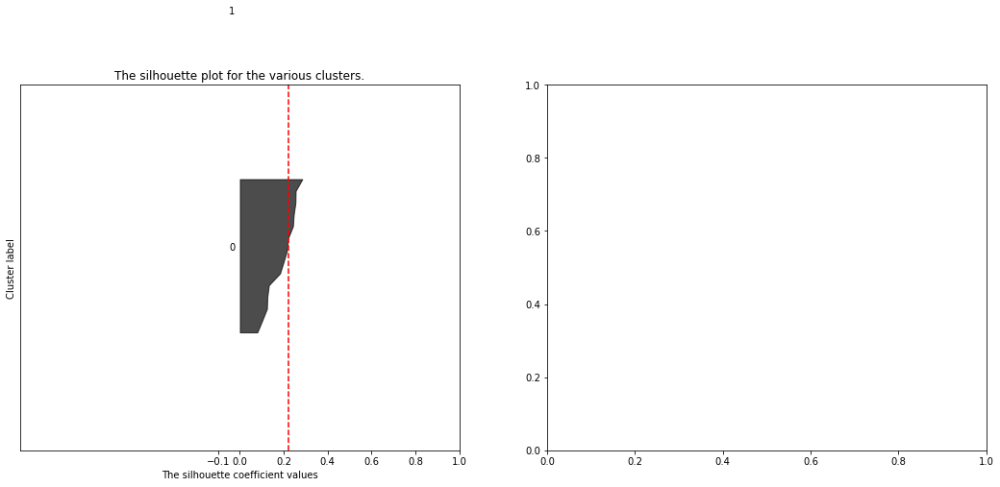

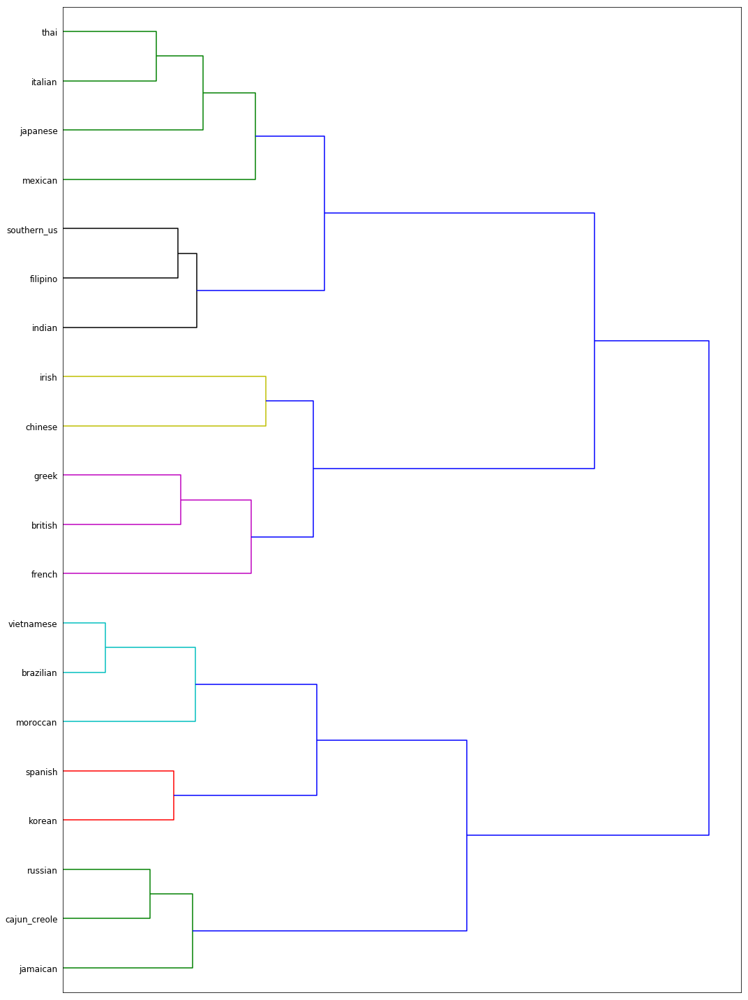

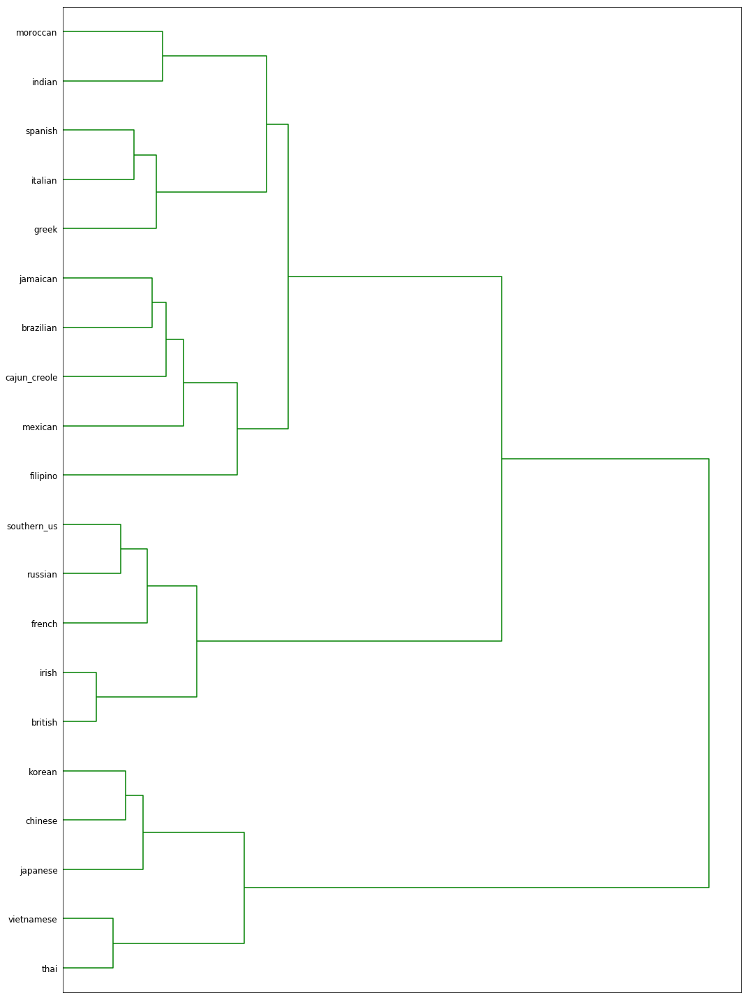

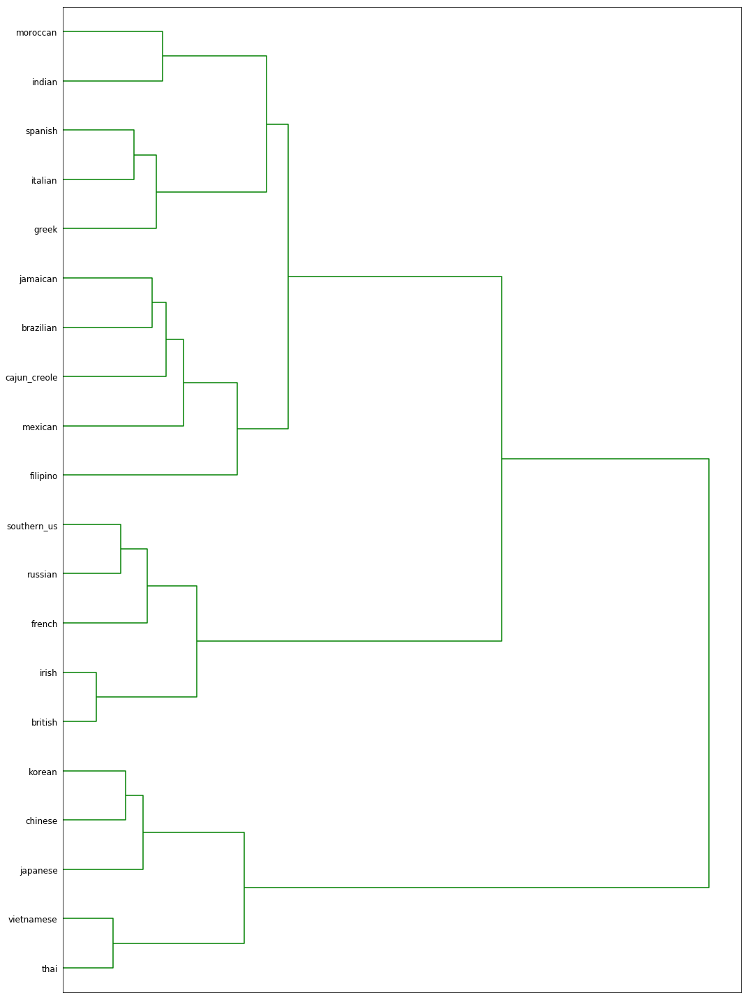

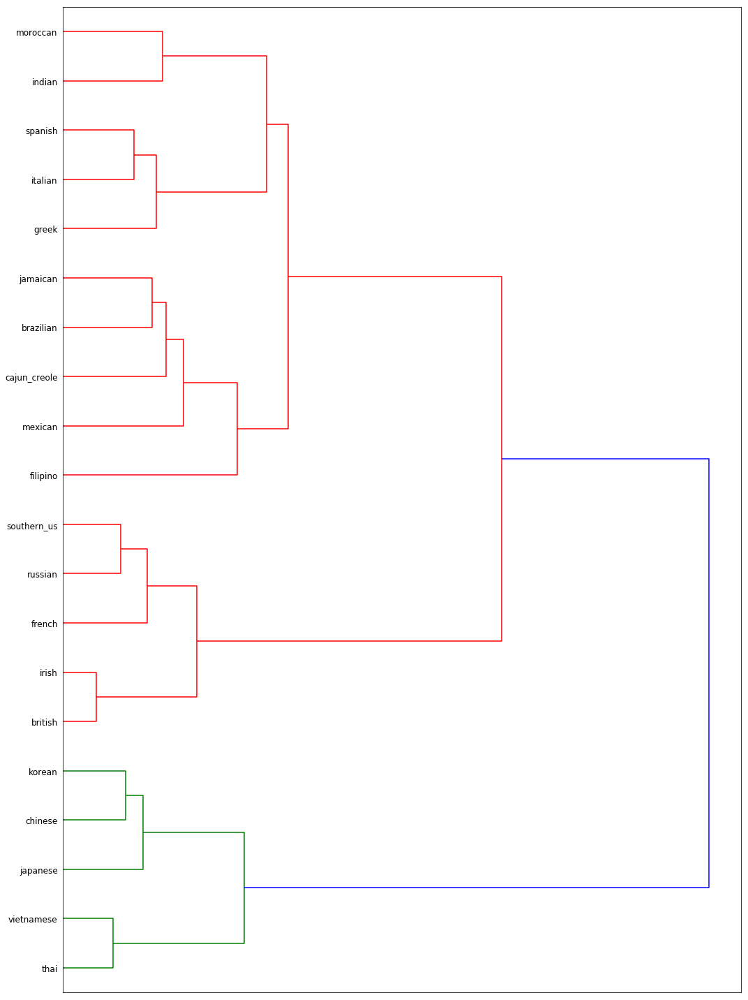

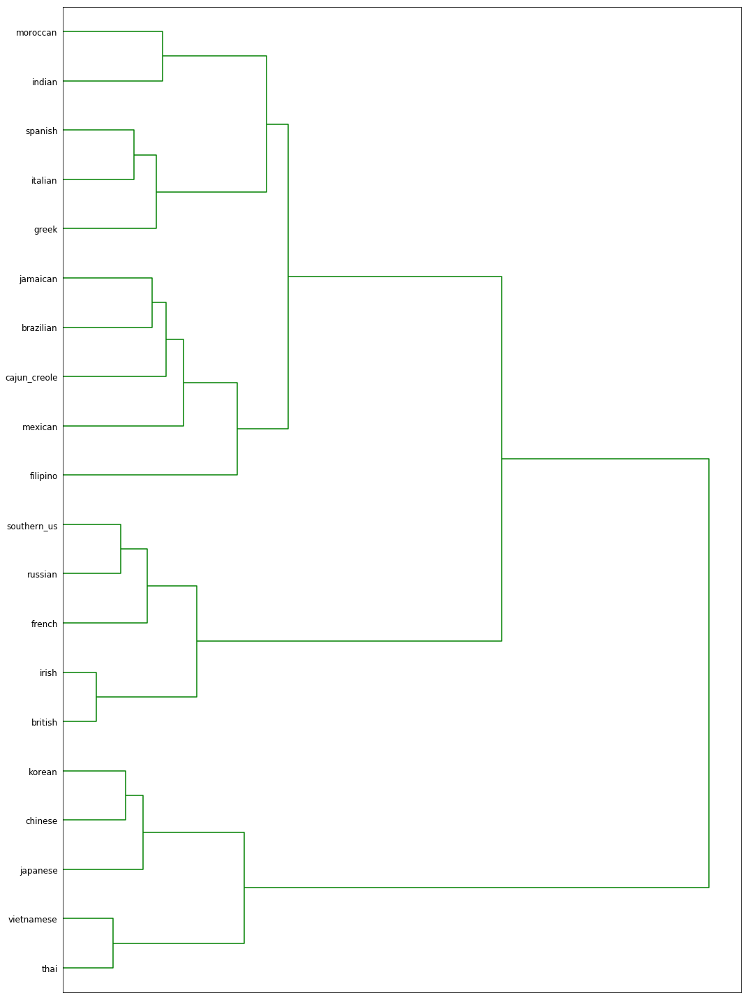

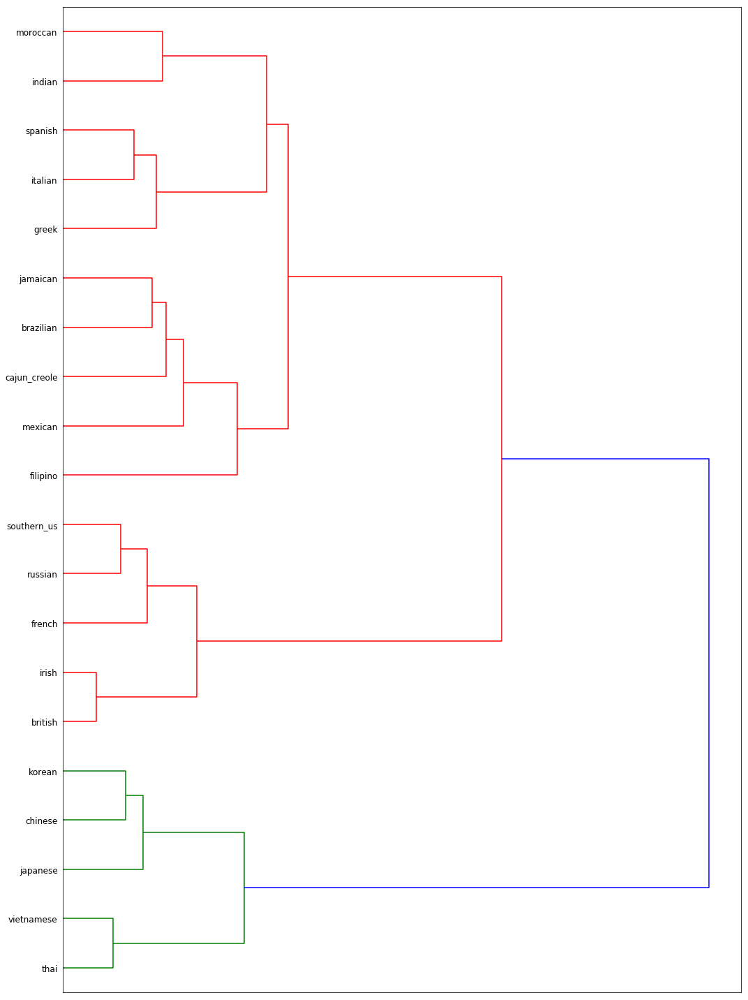

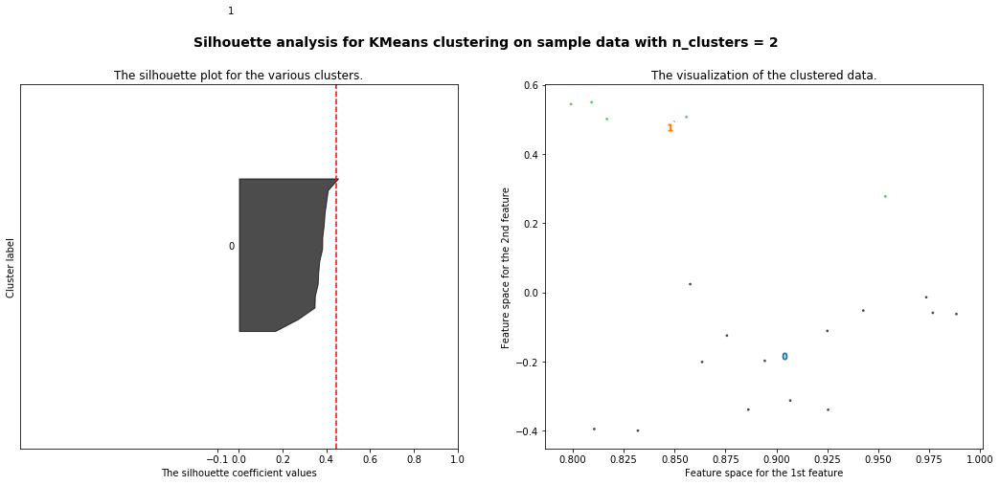

For n_clusters = 3 The average silhouette_score is : 0.550756164555


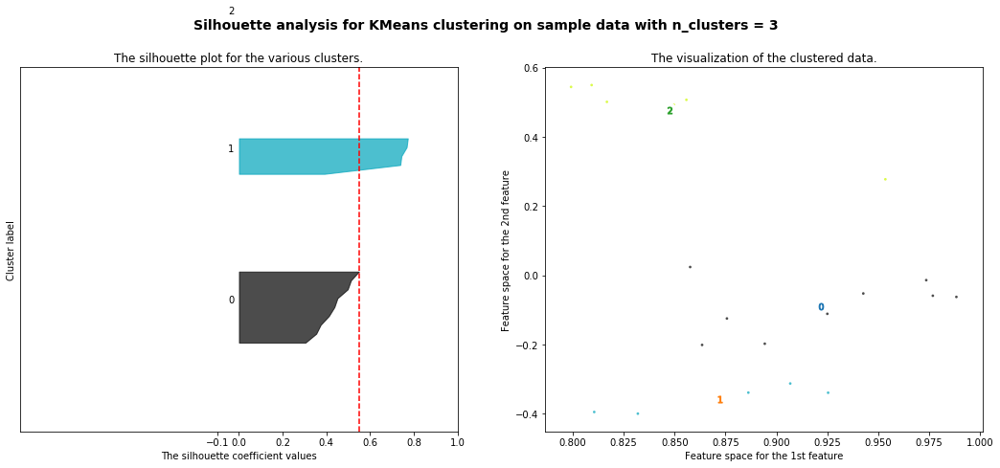

For n_clusters = 4 The average silhouette_score is : 0.557968454556


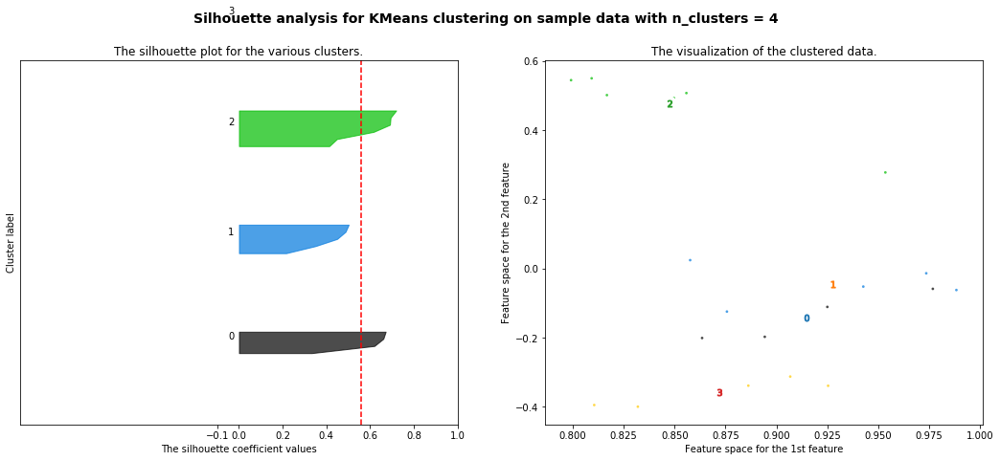

For n_clusters = 5 The average silhouette_score is : 0.51760693168


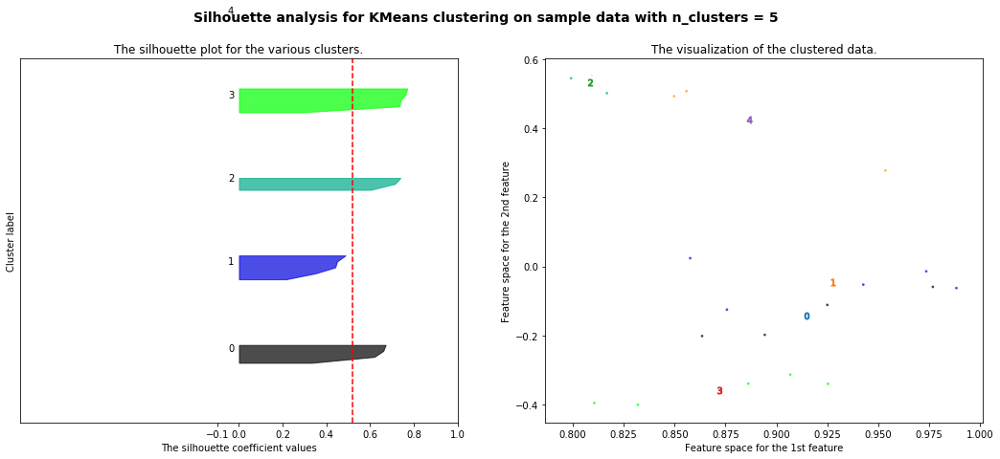

For n_clusters = 6 The average silhouette_score is : 0.46665784965


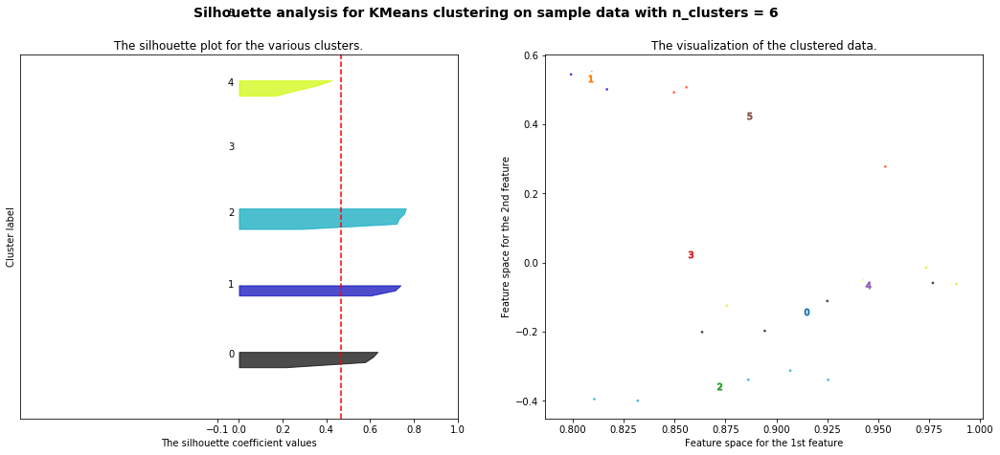

For n_clusters = 8 The average silhouette_score is : 0.411904646667


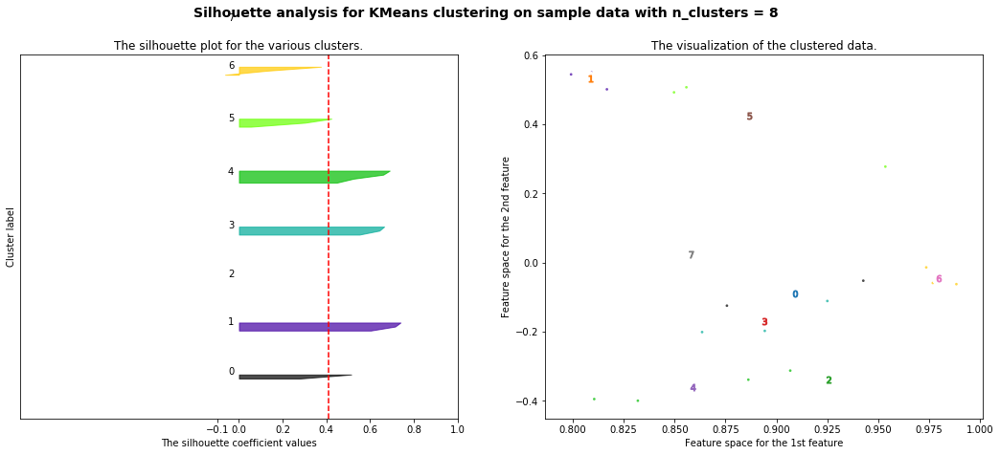

For n_clusters = 9 The average silhouette_score is : 0.447084718832


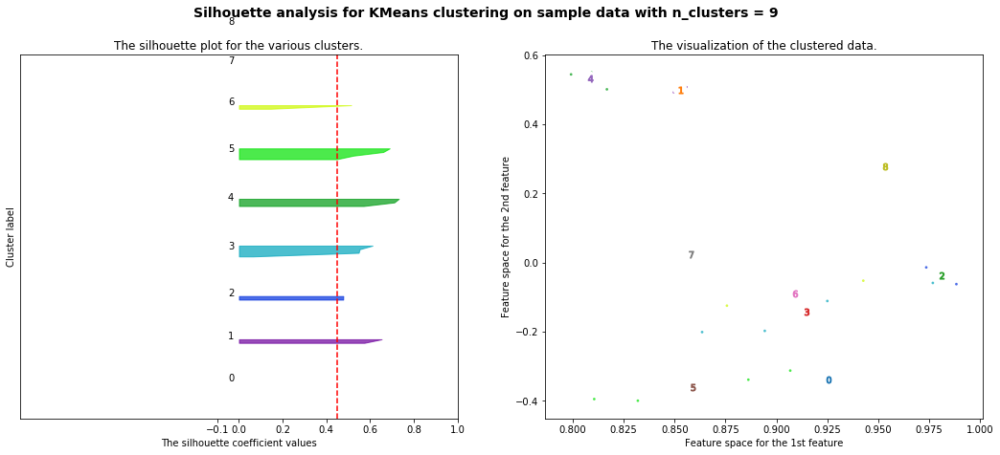

For n_clusters = 10 The average silhouette_score is : 0.403782889197


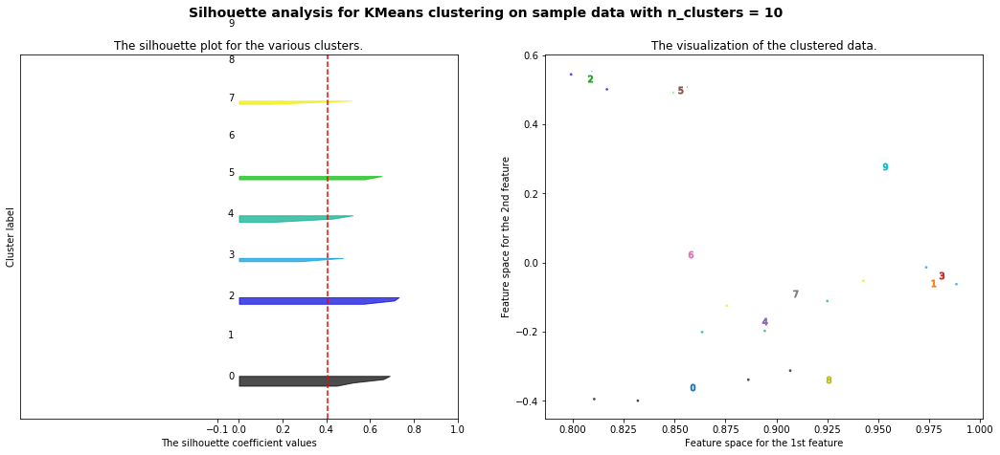

In [162]:
for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)
    
    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1
    ax1.set_xlim([-1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(cuisine_df) + (n_clusters + 1) * 10])
    
    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = KMeans(n_clusters=n_clusters, init="k-means++", random_state=10, max_iter=1000)
    cluster_labels = clusterer.fit_predict(X)
    
    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(X, cluster_labels)
    print("For n_clusters =", n_clusters,
          "The average silhouette_score is :", silhouette_avg)
    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(X, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.spectral(float(i) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # 2nd Plot showing the actual clusters formed
    colors = cm.spectral(cluster_labels.astype(float) / n_clusters)
    ax2.scatter(X[:, 0], X[:, 1], marker='.', s=30, lw=0, alpha=0.7,
                c=colors)

    # Labeling the clusters
    centers = clusterer.cluster_centers_
    # Draw white circles at cluster centers
    ax2.scatter(centers[:, 0], centers[:, 1],
                marker='o', c="white", alpha=1, s=200)

    for i, c in enumerate(centers):
        ax2.scatter(c[0], c[1], marker='$%d$' % i, alpha=1, s=50)

    ax2.set_title("The visualization of the clustered data.")
    ax2.set_xlabel("Feature space for the 1st feature")
    ax2.set_ylabel("Feature space for the 2nd feature")

    plt.suptitle(("Silhouette analysis for KMeans clustering on sample data "
                  "with n_clusters = %d" % n_clusters),
                 fontsize=14, fontweight='bold')

    plt.show()

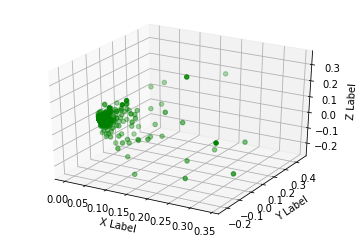

In [119]:
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt

svd_components = svd.components_

fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

ax.scatter(svd_components[0], svd_components[1], svd_components[2], c='g')

ax.set_xlabel('X Label')
ax.set_ylabel('Y Label')
ax.set_zlabel('Z Label')

plt.show()

In [164]:
svd.explained_variance_ 

AttributeError: 'PCA' object has no attribute 'explained_variance_ratio_'

## Hierarchical document clustering

In [144]:
from sklearn.metrics.pairwise import cosine_similarity
dist = 1 - cosine_similarity(X)
titles = list(cuisine_df)

In [149]:
from scipy.cluster.hierarchy import ward, dendrogram

linkage_matrix = ward(dist) #define the linkage_matrix using ward clustering pre-computed distances

fig, ax = plt.subplots(figsize=(15, 20)) # set size
ax = dendrogram(linkage_matrix, orientation="right", labels=titles);

plt.tick_params(\
    axis= 'x',          # changes apply to the x-axis
    which='both',      # both major and minor ticks are affected
    bottom='off',      # ticks along the bottom edge are off
    top='off',         # ticks along the top edge are off
    labelbottom='off')

plt.tight_layout() #show plot with tight layout

#uncomment below to save figure
plt.savefig('ward_clusters.png', dpi=200) #save figure as ward_clusters

## K Means with Tokenizer and Stemming

In [112]:
import nltk

In [113]:
tfidf_vectorizer = TfidfVectorizer(stop_words='english',
                                  use_idf=True)
X = tfidf_vectorizer.fit_transform(cuisine_df)

In [114]:
svd = TruncatedSVD(n_components=4, n_iter=10)
normalizer = Normalizer(copy=False)

In [115]:
lsa = make_pipeline(svd, normalizer)

In [116]:
X = lsa.fit_transform(X)

In [92]:
num_clusters = 5

km = KMeans(n_clusters=5)

%time km.fit(X)

clusters = km.labels_.tolist()

CPU times: user 22.7 ms, sys: 2.17 ms, total: 24.8 ms
Wall time: 23 ms


In [93]:
print(clusters)

[0, 2, 1, 1, 0, 4, 3, 1, 1, 2, 1, 4, 4, 3, 3, 4, 0, 4, 0, 2]


In [104]:
cuisine_df

,brazilian,british,cajun_creole,chinese,filipino,french,greek,indian,irish,italian,jamaican,japanese,korean,mexican,moroccan,russian,southern_us,spanish,thai,vietnamese
0,ice cubes club soda white rum lime turbinado e...,greek yogurt lemon curd confectioners sugar ra...,herbs lemon juice fresh tomatoes paprika mango...,low sodium soy sauce fresh ginger dry mustard ...,eggs pepper salt mayonaise cooking oil green c...,sugar salt fennel bulb water lemon olive oil g...,romaine lettuce black olives grape tomatoes ga...,water vegetable oil wheat salt black pepper sh...,cooking spray salt black pepper yukon gold pot...,sugar pistachio nuts white almond bark flour v...,plain flour sugar butter eggs fresh ginger roo...,sirloin mirin yellow onion low sodium soy sauc...,jasmine rice garlic scallions sugar shiitake G...,olive oil purple onion fresh pineapple pork po...,ground cloves whole nutmegs ground ginger grou...,water grits mozzarella cheese salt water dill ...,plain flour ground pepper salt tomatoes ground...,olive oil salt medium shrimp pepper garlic cho...,sugar hot chili asian fish sauce lime juice po...,soy sauce vegetable oil red bell pepper chicke...


In [95]:
df = pd.DataFrame(cuisine_df, index = [clusters])

In [97]:
print(d)

{'greek': ["romaine lettuce black olives grape tomatoes garlic pepper purple onion seasoning garbanzo beans feta cheese crumbles ground pork finely chopped fresh parsley onions salt vinegar caul fat minced garlic dried oregano red wine vinegar olive oil boneless chop pork lemon juice orange anise cinnamon sticks unflavored gelatin zinfandel orange blossom honey sugar lemon calimyrna figs clove honey whipping cream plain whole-milk yogurt fresh dill yoghurt salt myzithra large eggs cheese feta cheese phyllo kefalotyri ground black pepper extra-virgin olive oil onions olive oil salt hamburger buns paprika chopped fresh mint ground cinnamon balsamic vinegar feta cheese crumbles baby spinach leaves purple onion ground lamb pepper dried mint flakes salt dried oregano tomatoes ground black pepper garlic dried dillweed olive oil red wine lamb plain yogurt pita bread rounds purple onion cucumber garbanzo beans liquid black pepper garlic tahini lemon juice olive oil salt dry red wine cinnamon s